In [1]:
%env CUDA_VISIBLE_DEVICES=0
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow.keras as keras
import imageio
import moviepy.editor as mpy
import time
import pathlib
import random
import IPython.display as display

BATCH_SIZE = 700
SAMPLE_COL = 8
SAMPLE_ROW = 8
SAMPLE_NUM = SAMPLE_COL * SAMPLE_ROW
IMG_H = 64
IMG_W = 64
IMG_C = 3
IMG_SHAPE = (IMG_H, IMG_W, IMG_C)
Z_DIM = 128
BUF = 40000
W_EPOCH = 90
BZ = (BATCH_SIZE, Z_DIM)
#WClipLo = -0.01
#WClipHi = 0.01
IW_LR=1e-4

env: CUDA_VISIBLE_DEVICES=0


In [2]:
gpus = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpus[0], True)
tf.config.experimental.set_virtual_device_configuration(gpus[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit = 4500)])

In [3]:
data_root = pathlib.Path('./img_align_celeba_png/')
all_image_paths = list(data_root.glob('*'))
all_image_paths = [str(path) for path in all_image_paths]
all_image_paths=sorted(all_image_paths)
image_count = len(all_image_paths)

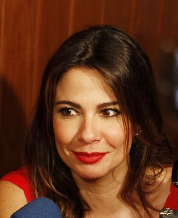

img_align_celeba_png/026658.png


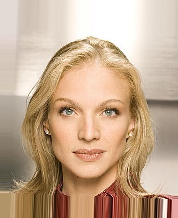

img_align_celeba_png/037219.png


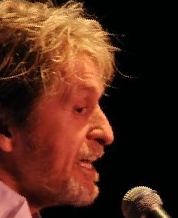

img_align_celeba_png/146878.png


In [4]:
for n in range(3):
    image_path = random.choice(all_image_paths)
    display.display(display.Image(image_path, width=200, height=200))
    print(image_path)

In [5]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=IMG_C)
    img = tf.image.convert_image_dtype(img, tf.float32)
    img = tf.image.resize(img, (IMG_H, IMG_W))
    return img

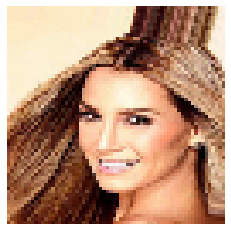

In [6]:
#load_image test
img_test=load_image('img_align_celeba_png/000001.png')
plt.imshow(img_test)
plt.axis("off")
#plt.title("Epoch %d" % ep)
plt.show()

In [7]:
dataset_list = tf.data.Dataset.from_tensor_slices(all_image_paths)
dsTrain = dataset_list.map(load_image).shuffle(BUF).batch(BATCH_SIZE, True)

In [8]:
dsTrain

<BatchDataset shapes: (700, 64, 64, 3), types: tf.float32>

In [9]:
#(train_images, _), (test_images, _) = tf.keras.datasets.mnist.load_data()

#iTrain = train_images.reshape(-1, 28, 28, 1).astype(np.float32)

# Normalizing the images to the range of [0., 1.]
#iTrain = iTrain / 255.0

#dsTrain = tf.data.Dataset.from_tensor_slices(iTrain).shuffle(BUF).batch(BATCH_SIZE, True)

 #Utility function
def utPuzzle(imgs, row, col, path = None):
    h, w, c = imgs[0].shape
    out = np.zeros((h * row, w * col, c), np.uint8)
    for n, img in enumerate(imgs):
        j, i = divmod(n, col)
        out[j * h : (j + 1) * h, i * w : (i + 1) * w, :] = img
    if path is not None : imageio.imwrite(path, out)
    return out
  
def utMakeGif(imgs, fname, duration):
    n = float(len(imgs)) / duration
    clip = mpy.VideoClip(lambda t : imgs[int(n * t)], duration = duration)
    clip.write_gif(fname, fps = n)

In [10]:
#DCG, DCD = GAN(IMG_SHAPE, Z_DIM)
sp = IMG_SHAPE
zd = Z_DIM
xh, xw, xc = sp
zh = xh // 4 #28/4
zw = xw // 4


In [11]:
def GAN(sp, zd):
    # Shape
    xh, xw, xc = sp#64,64,1
    zh = xh // 4 #7
    zw = xw // 4 #7
    
    # Model
    return keras.Sequential([
        keras.layers.Dense(units  =  1024, input_shape = (zd,)),
        keras.layers.BatchNormalization(),
        keras.layers.ReLU(),
        keras.layers.Dense(units  =  zh * zw << 8),#7*7*(2**8=256)
        keras.layers.BatchNormalization(),
        keras.layers.ReLU(),
        keras.layers.Reshape(target_shape = (zh, zw, 256)),
        keras.layers.Conv2DTranspose(
            filters = 32,
            kernel_size = 5,
            strides = 2,
            padding = "SAME"
        ),
        keras.layers.BatchNormalization(),
        keras.layers.ReLU(),
        keras.layers.Conv2DTranspose(
            filters = xc,
            kernel_size = 5,
            strides = 2,
            padding = "SAME",
            activation = keras.activations.sigmoid
        ),
    ]), keras.Sequential([
        keras.layers.Conv2D(
            filters = 32,
            kernel_size = 5,
            strides = (2, 2),
            padding = "SAME",
            input_shape = sp,
        ),
        keras.layers.LeakyReLU(),
        #keras.layers.Dropout(0.3),
        keras.layers.Conv2D(
            filters = 128,
            kernel_size = 5,
            strides = (2, 2),
            padding = "SAME"
        ),
        keras.layers.BatchNormalization(),
        keras.layers.LeakyReLU(),
        #keras.layers.Dropout(0.3),
        keras.layers.Flatten(),
        keras.layers.Dense(units  =  1024),
        keras.layers.BatchNormalization(),
        keras.layers.LeakyReLU(),
        keras.layers.Dense(units  =  1),
    ])

s = tf.random.normal([SAMPLE_NUM, Z_DIM])

In [12]:
WG, WD = GAN(IMG_SHAPE, Z_DIM)

In [13]:
WG.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1024)              132096    
_________________________________________________________________
batch_normalization (BatchNo (None, 1024)              4096      
_________________________________________________________________
re_lu (ReLU)                 (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 65536)             67174400  
_________________________________________________________________
batch_normalization_1 (Batch (None, 65536)             262144    
_________________________________________________________________
re_lu_1 (ReLU)               (None, 65536)             0         
_________________________________________________________________
reshape (Reshape)            (None, 16, 16, 256)       0

In [14]:
WD.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 32)        2432      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 128)       102528    
_________________________________________________________________
batch_normalization_3 (Batch (None, 16, 16, 128)       512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
flatten (Flatten)            (None, 32768)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 1024)             

In [15]:
opg = keras.optimizers.Adam(learning_rate=IW_LR,beta_1=0.,beta_2=0.9)
opd = keras.optimizers.Adam(learning_rate=IW_LR,beta_1=0.,beta_2=0.9)

In [16]:
@tf.function
def WGTrain(c1):
    z = tf.random.normal(BZ)

    with tf.GradientTape() as tpg:
        c0 = WG(z, training = True)

        z1 = WD(c1, training = True)
        z0 = WD(c0, training = True)

        ld = tf.reduce_mean(z0)
        lg = - ld
        ld = ld - tf.reduce_mean(z1)

    gg = tpg.gradient(lg, WG.trainable_variables)

    opg.apply_gradients(zip(gg, WG.trainable_variables))
    
    return lg, ld

@tf.function
def WDTrain(c1):
    #print(c1.shape)
    z = tf.random.normal(BZ)

    with tf.GradientTape() as tpd:
        c0 = WG(z, training = True)

        z1 = WD(c1, training = True)
        z0 = WD(c0, training = True)

        ld = tf.reduce_mean(z0)
        lg = - ld
        ld = ld - tf.reduce_mean(z1)
                
        epsilon = tf.random.uniform([BATCH_SIZE, 1, 1, 1], 0., 1.)
        diff = c0-c1
        inter = c1+(epsilon*diff)
        with tf.GradientTape() as t:
            t.watch(inter)
            pred = WD(inter, training=True)
        grad = t.gradient(pred, [inter])[0]
        norm = tf.norm(tf.reshape(grad, [tf.shape(grad)[0], -1]), axis=1)
        gp = tf.reduce_mean((norm-1.) **2)
        
        grad_penalty_weight = 10.0
        ld += grad_penalty_weight*gp

    gd = tpd.gradient(ld, WD.trainable_variables)
    opd.apply_gradients(zip(gd, WD.trainable_variables))
    #for v in WD.trainable_variables : v.assign(tf.clip_by_value(v, WClipLo, WClipHi))
    return lg, ld

WTrain = (
    WDTrain,
    WDTrain,
    WDTrain,
    WDTrain,
    WDTrain,
    WGTrain
)

WCritic = len(WTrain)

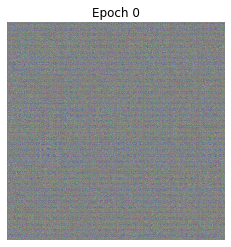

Time taken 551.3405921459198 sec



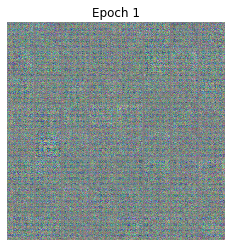

Time taken 554.6517817974091 sec



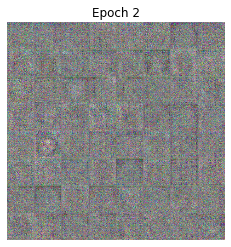

Time taken 546.0641252994537 sec



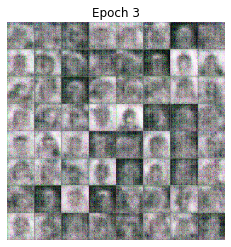

Time taken 536.3851053714752 sec



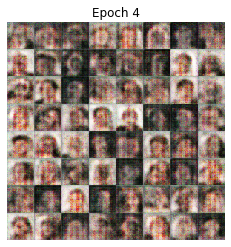

Time taken 539.8627557754517 sec



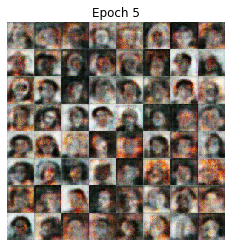

Time taken 537.4082140922546 sec



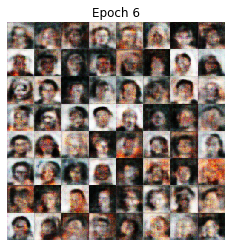

Time taken 544.6215870380402 sec



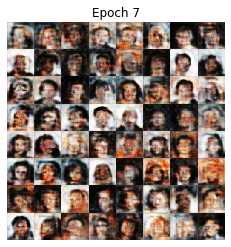

Time taken 601.7192199230194 sec



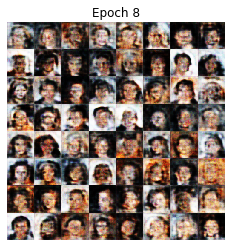

Time taken 549.1226000785828 sec



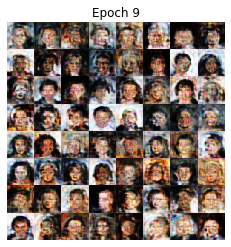

Time taken 545.5541954040527 sec



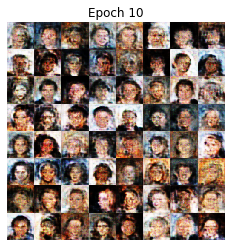

Time taken 542.0504455566406 sec



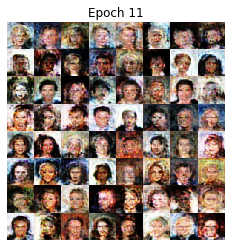

Time taken 538.580267906189 sec



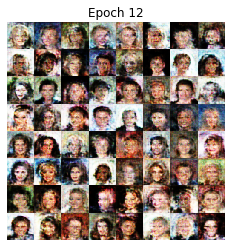

Time taken 541.3432579040527 sec



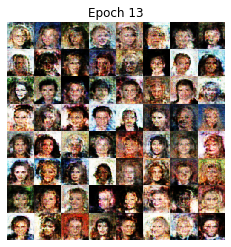

Time taken 547.4952759742737 sec



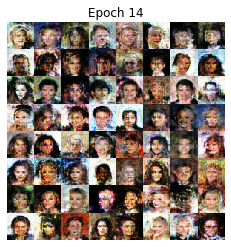

Time taken 549.1659796237946 sec



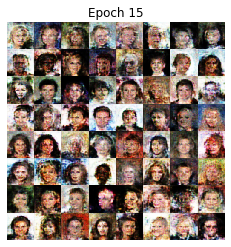

Time taken 541.1078732013702 sec



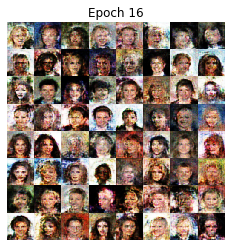

Time taken 537.3350441455841 sec



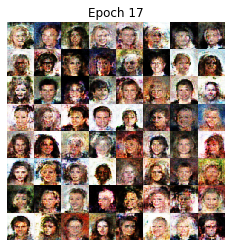

Time taken 542.680867433548 sec



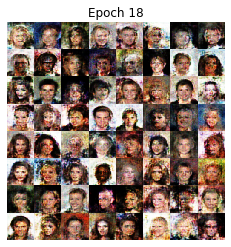

Time taken 541.7073123455048 sec



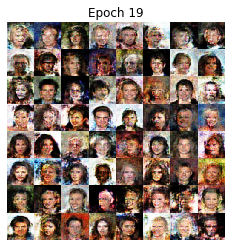

Time taken 545.9965047836304 sec



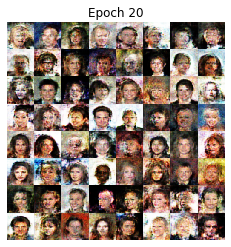

Time taken 543.4341421127319 sec



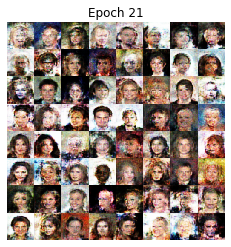

Time taken 547.4343793392181 sec



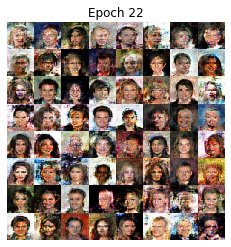

Time taken 541.898255109787 sec



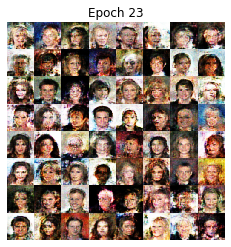

Time taken 544.4843380451202 sec



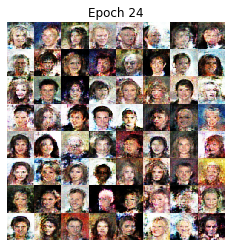

Time taken 542.9966790676117 sec



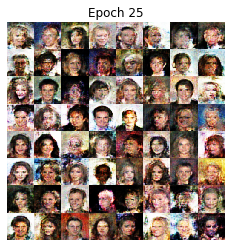

Time taken 543.0131342411041 sec



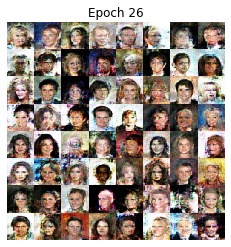

Time taken 546.6731991767883 sec



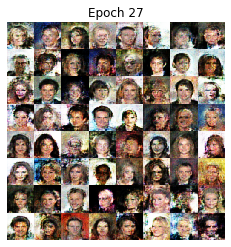

Time taken 541.7967774868011 sec



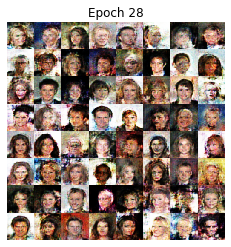

Time taken 544.4256210327148 sec



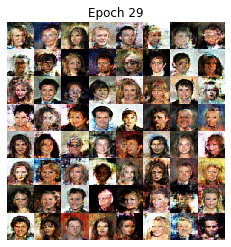

Time taken 540.8312888145447 sec



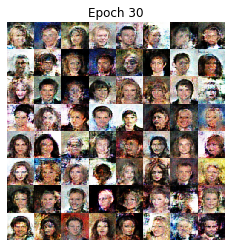

Time taken 541.7377216815948 sec



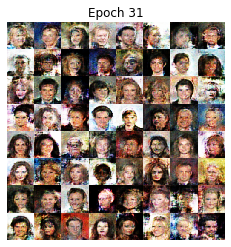

Time taken 546.9772124290466 sec



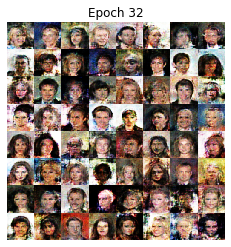

Time taken 546.8015565872192 sec



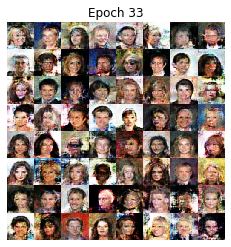

Time taken 541.3050932884216 sec



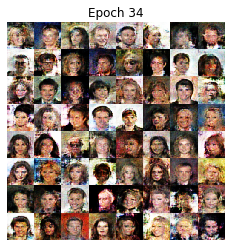

Time taken 542.9985308647156 sec



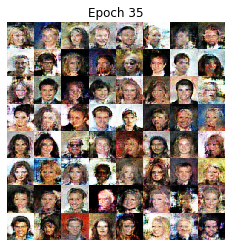

Time taken 542.8251440525055 sec



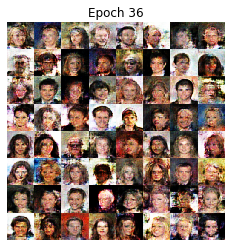

Time taken 546.4251868724823 sec



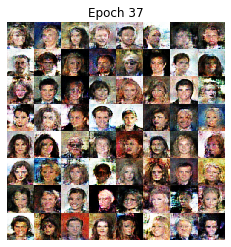

Time taken 544.6067245006561 sec



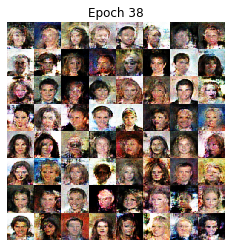

Time taken 546.6624341011047 sec



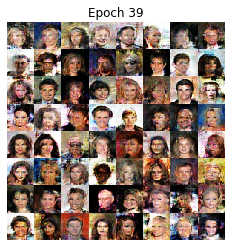

Time taken 546.1125614643097 sec



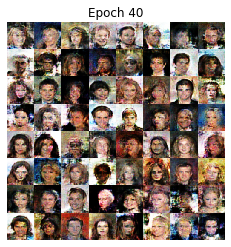

Time taken 550.1721551418304 sec



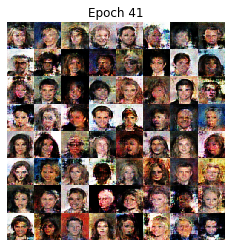

Time taken 547.4337928295135 sec



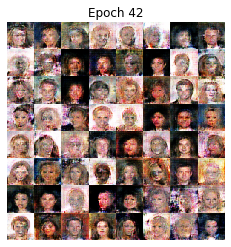

Time taken 556.407793045044 sec



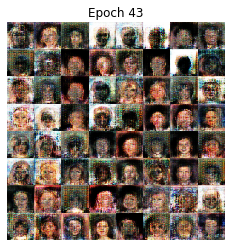

Time taken 556.249763250351 sec



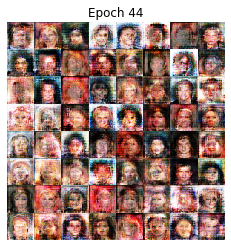

Time taken 564.5569717884064 sec



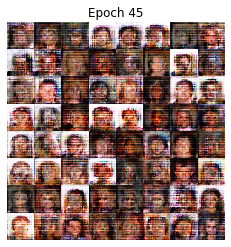

Time taken 543.6805667877197 sec



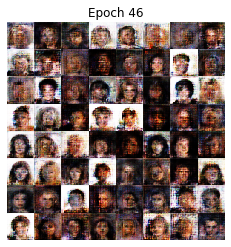

Time taken 546.370513677597 sec



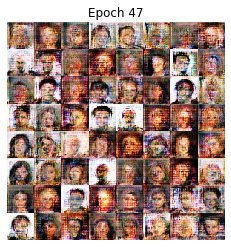

Time taken 544.8120114803314 sec



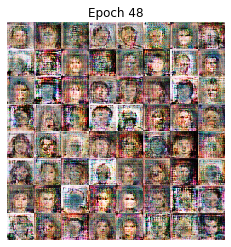

Time taken 548.1665687561035 sec



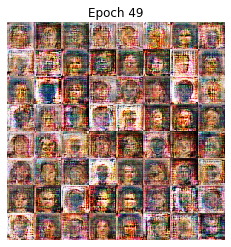

Time taken 551.0464305877686 sec



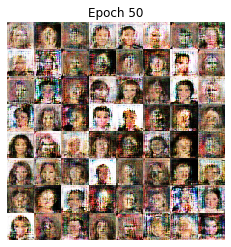

Time taken 549.8879532814026 sec



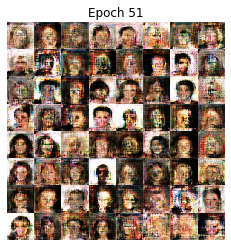

Time taken 548.3537385463715 sec



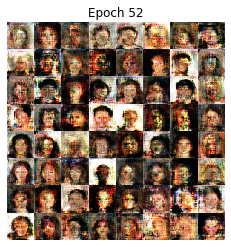

Time taken 545.908613204956 sec



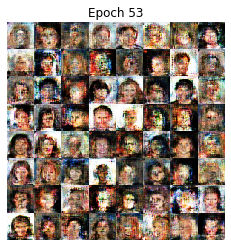

Time taken 554.1920778751373 sec



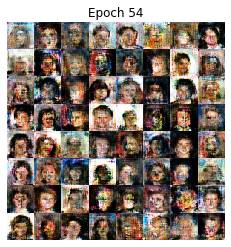

Time taken 547.4826874732971 sec



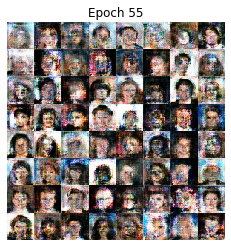

Time taken 547.0029776096344 sec



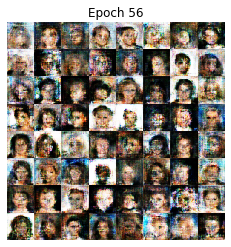

Time taken 545.0439217090607 sec



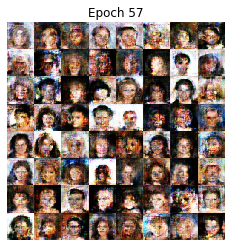

Time taken 547.6037483215332 sec



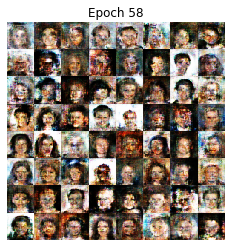

Time taken 551.6779854297638 sec



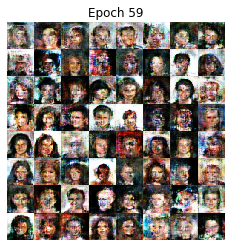

Time taken 546.5121507644653 sec



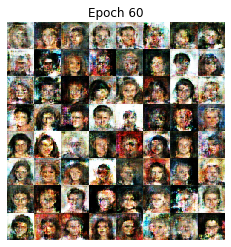

Time taken 549.8778369426727 sec



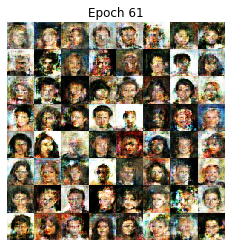

Time taken 545.1479778289795 sec



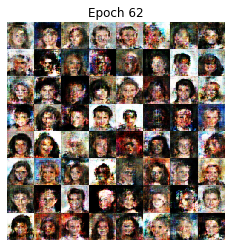

Time taken 542.264134645462 sec



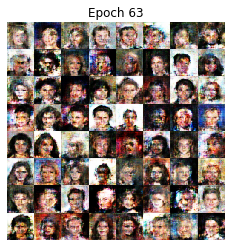

Time taken 545.0219933986664 sec



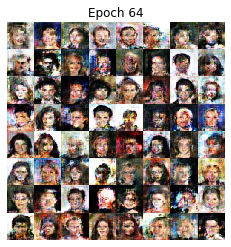

Time taken 551.8132815361023 sec



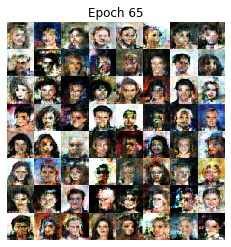

Time taken 543.3249680995941 sec



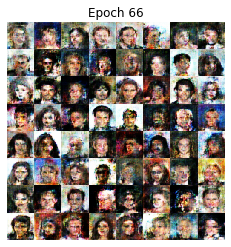

Time taken 555.7626793384552 sec



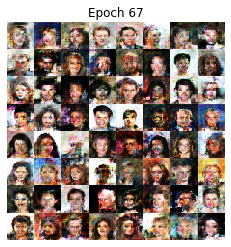

Time taken 551.7589907646179 sec



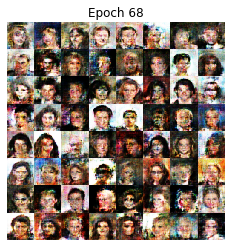

Time taken 548.197202205658 sec



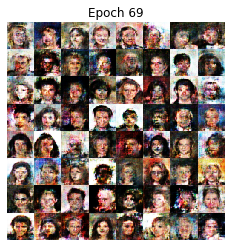

Time taken 549.902509689331 sec



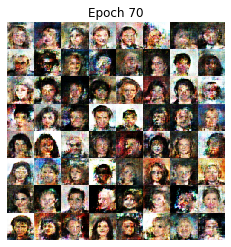

Time taken 545.5289618968964 sec



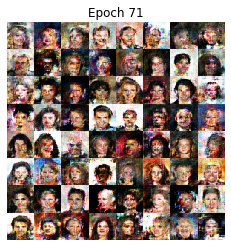

Time taken 546.5139269828796 sec



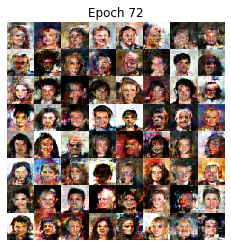

Time taken 548.181277513504 sec



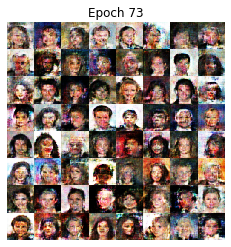

Time taken 555.1803615093231 sec



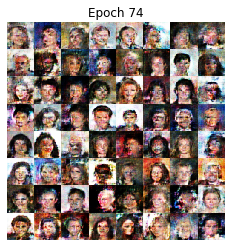

Time taken 553.7410218715668 sec



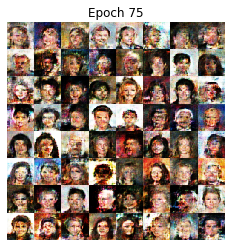

Time taken 549.4055206775665 sec



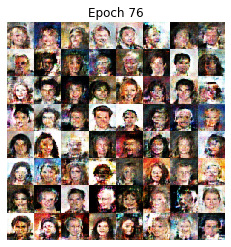

Time taken 549.7484424114227 sec



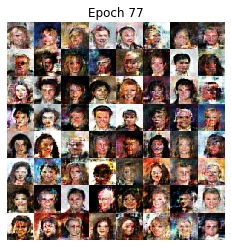

Time taken 543.7161512374878 sec



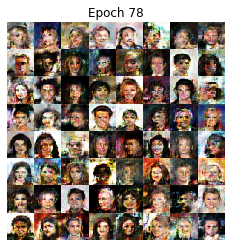

Time taken 546.0023462772369 sec



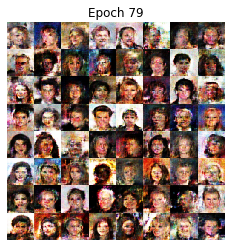

Time taken 552.4871418476105 sec



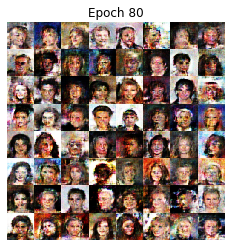

Time taken 553.9414067268372 sec



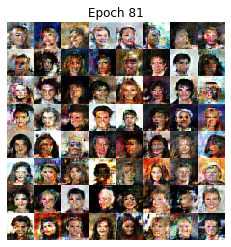

Time taken 555.0833904743195 sec



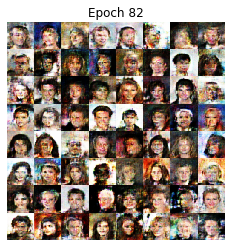

Time taken 549.6362550258636 sec



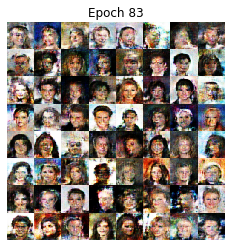

Time taken 551.8429522514343 sec



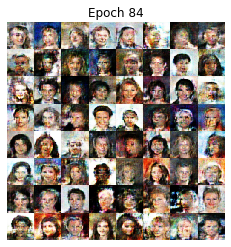

Time taken 550.8676564693451 sec



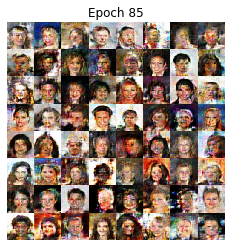

Time taken 550.4758958816528 sec



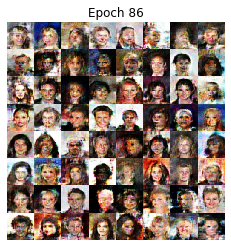

Time taken 550.1538288593292 sec



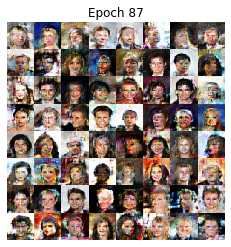

Time taken 556.8397617340088 sec



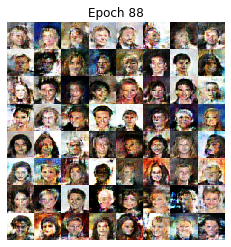

Time taken 549.9141962528229 sec



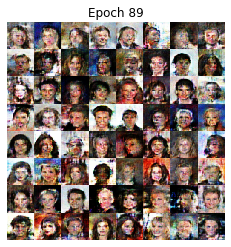

Time taken 548.0013439655304 sec



In [17]:
wlg = [None] * W_EPOCH
wld = [None] * W_EPOCH
wsp = [None] * W_EPOCH
rsTrain = float(BATCH_SIZE) / float(image_count)
ctr = 0
for ep in range(W_EPOCH):
    start = time.time()
    lgt = 0.0
    ldt = 0.0
    for c1 in dsTrain:
        lg, ld = WTrain[ctr](c1)
        ctr += 1
        lgt += lg.numpy()
        ldt += ld.numpy()
        if ctr == WCritic : ctr = 0
    wlg[ep] = lgt * rsTrain
    wld[ep] = ldt * rsTrain
    
    out = WG(s, training = False)
    img = utPuzzle(
        (out * 255.0).numpy().astype(np.uint8),
        SAMPLE_COL,
        SAMPLE_ROW,
        "test3-2/w_%04d.png" % ep
    )
    wsp[ep] = img
    #if ep % 3 == 0:
    plt.imshow(img)
    plt.axis("off")
    plt.title("Epoch %d" % ep)
    plt.show()
    print ('Time taken {} sec\n'.format(time.time() - start))

In [18]:
utMakeGif(np.array(wsp), "test3-2/iwgan-3.gif", duration = 2)

t:   0%|          | 0/90 [00:00<?, ?it/s, now=None]

MoviePy - Building file test3-2/iwgan-3.gif with imageio.


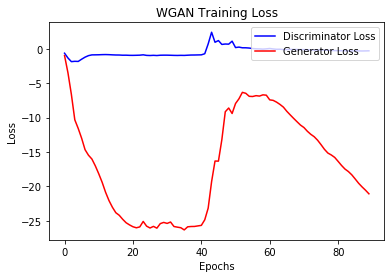

In [19]:
plt.plot(range(W_EPOCH), wld, color = "blue", label = "Discriminator Loss")
plt.plot(range(W_EPOCH), wlg, color = "red", label = "Generator Loss")
plt.legend(loc = "upper right")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("WGAN Training Loss")
plt.show()

#report

1.建立dataset，使用tf.data.Dataset先資料夾內所有圖片的名字存到dataset中，再用map function，
使用 load_image 進行資料預處理，建立圖片dataset。
    
2.dsTrain = dataset_list.map(load_image).shuffle(BUF).batch(BATCH_SIZE, True)
將dataset shuffle 和因為演算法中的batch size 的foor loop，所以對dataset做batch化。

3.將WGAN的optimizers改成Adam根據演算法中的調整參數
opg = keras.optimizers.Adam(learning_rate=IW_LR,beta_1=0.,beta_2=0.9)
opd = keras.optimizers.Adam(learning_rate=IW_LR,beta_1=0.,beta_2=0.9)

4.在WDTrain修改loss算法和增加gradient penalty